In [1]:
%cd ..

/pub/hofmann-scratch/glanzillo/ded


In [2]:

import json
import math
import os
import socket
import sys
import time
import datetime
import uuid
from argparse import ArgumentParser
import setproctitle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import AutoMinorLocator
from matplotlib.collections import LineCollection
import json

internal_path = os.path.abspath(os.path.join('.'))
sys.path.append(internal_path)
sys.path.append(internal_path + '/datasets')
sys.path.append(internal_path + '/utils')

import shutil
from utils.args import add_management_args, add_rehearsal_args
from utils.conf import set_random_seed, get_device, base_path
from utils.status import ProgressBar
from utils.stil_losses import *
from utils.nets import *
from utils.eval import evaluate, validation_and_agreement, distance_models, evaluate_regression


from sklearn.datasets import *
from sklearn import linear_model



/local/home/glanzillo/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Linear regression

In [3]:
logs_path = './logs/results/regression/linear/logs.txt'
results = []
with open(logs_path) as f:
    while line := f.readline():
        results.append(json.loads(line))

In [4]:
res_df = pd.DataFrame(results)
res_df

,problem_type,N,buffer_size,D,G,C,effective_rank,noise,data_seed,alpha,...,conf_host,final_val_acc_D,final_distance_teacher_optimum,wandb_url,buffer_train_time,final_train_acc_S,final_train_leftout_acc_S,final_val_acc_S,final_distance_teacher_student,final_distance_student_optimum
0,regression,10000,100,500,100,1,None,1.0,13,1.0,...,porcino.inf.ethz.ch,1.028533,0.216912,https://wandb.ai/continually/DataEfficientDist...,0.026477,1.730947e-24,303290.368693,306218.901989,552.641768,552.645372
1,regression,10000,100,500,100,1,None,1.0,13,0.0,...,porcino.inf.ethz.ch,1.028533,0.216912,https://wandb.ai/continually/DataEfficientDist...,0.021650,1.170468e+00,279130.892653,280408.215446,531.049703,531.048671
2,regression,10000,100,500,100,1,None,1.0,13,1.0,...,porcino.inf.ethz.ch,1.028533,0.216912,https://wandb.ai/continually/DataEfficientDist...,0.020811,1.839585e-24,261104.063355,262601.843171,512.091521,512.089354
3,regression,10000,10,500,100,1,None,0.1,13,0.0,...,porcino.inf.ethz.ch,0.010285,0.021691,https://wandb.ai/continually/DataEfficientDist...,0.007895,1.863646e-02,633974.690106,644077.179056,587.963088,587.962525
4,regression,10000,10,500,100,1,None,0.5,13,0.0,...,porcino.inf.ethz.ch,0.257133,0.108456,https://wandb.ai/continually/DataEfficientDist...,0.007410,4.659115e-01,633969.915744,644071.919708,587.965349,587.962525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2097,regression,10000,4000,500,100,1,None,1.0,13,1.0,...,porcino.inf.ethz.ch,1.028533,0.216912,NaN,0.617172,8.679778e-01,1.164172,1.118107,0.304172,0.366866
2098,regression,10000,4000,500,100,1,None,10.0,13,1.0,...,porcino.inf.ethz.ch,102.853309,2.169117,NaN,0.514844,8.679778e+01,116.417177,111.810699,3.041718,3.668660
2099,regression,10000,4000,500,100,1,None,2.0,13,1.0,...,porcino.inf.ethz.ch,4.114132,0.433823,NaN,0.680441,3.471911e+00,4.656687,4.472428,0.608344,0.733732
2100,regression,10000,4000,500,100,1,None,5.0,13,1.0,...,porcino.inf.ethz.ch,25.713327,1.084558,NaN,0.619156,2.169944e+01,29.104294,27.952675,1.520859,1.834330


In [177]:
res_df.columns

Index(['problem_type', 'N', 'buffer_size', 'D', 'G', 'C', 'effective_rank',
       'noise', 'data_seed', 'alpha', 'gpus_id', 'seed', 'notes',
       'non_verbose', 'disable_log', 'validation', 'ignore_other_metrics',
       'debug_mode', 'nowand', 'wandb_entity', 'wandb_project', 'wandb_name',
       'conf_jobnum', 'conf_timestamp', 'conf_host', 'final_val_acc_D',
       'final_distance_teacher_optimum', 'wandb_url', 'buffer_train_time',
       'final_train_acc_S', 'final_train_leftout_acc_S', 'final_val_acc_S',
       'final_distance_teacher_student', 'final_distance_student_optimum'],
      dtype='object')

In [178]:
SEEDS = [11, 13, 21, 33, 55 ,5,138,228,196,118]
BUFFER_SIZES = [10, 100, 500, 1000, 20000, 30000, 40000]
NOISE = [0.0, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]

In [179]:
res_df['buffer_size_p'] = res_df['buffer_size']/(10000)
res_df['generalization_gap'] = res_df['final_val_acc_S']-res_df['final_train_acc_S']
res_df['buffer_gap'] = res_df['final_train_leftout_acc_S']-res_df['final_train_acc_S']
res_df['final_val_acc_S_p'] = 100*res_df['final_val_acc_S']/(res_df['final_val_acc_D'])
res_df['final_train_acc_S_p'] = 100*res_df['final_train_acc_S']/(res_df['final_val_acc_D'])

In [180]:
res_df['buffer_size_p'].unique(), res_df['noise'].unique()


(array([0.01 , 0.001, 0.05 , 0.1  , 0.2  , 0.02 , 0.03 , 0.04 , 0.06 ,
        0.07 , 0.08 , 0.09 , 0.3  , 0.4  ]),
 array([ 1. ,  0.1,  0.5,  0. ,  5. ,  2. , 10. ]))

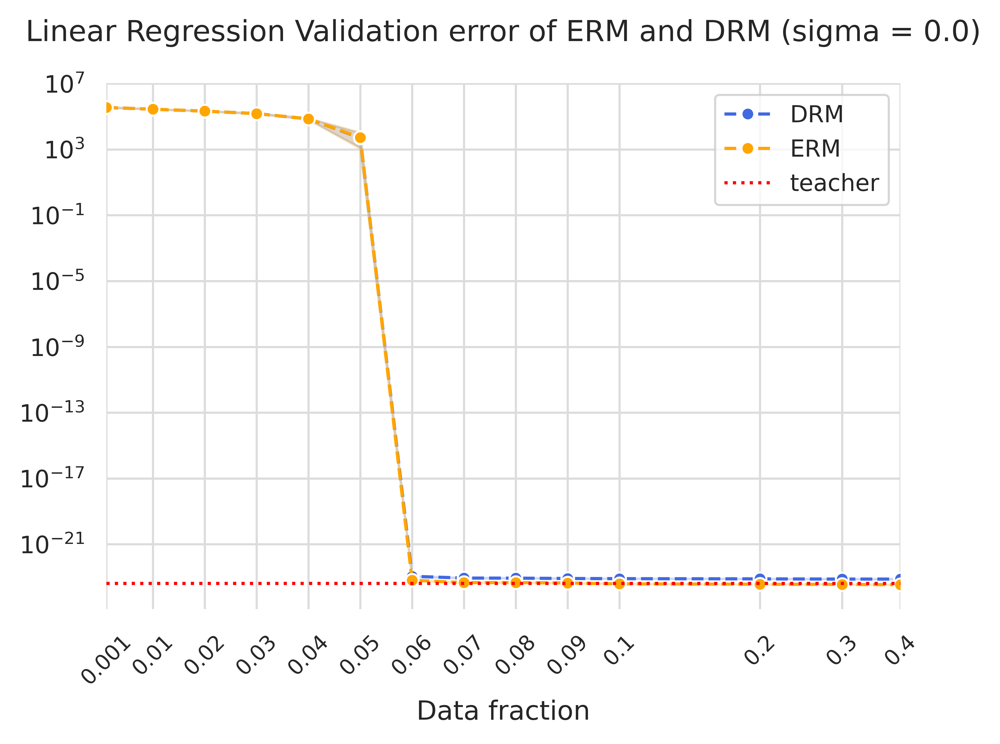

In [181]:
min_max = lambda x: (x.min(), x.max())
noise = .0
working_df = res_df.loc[res_df['noise']==noise]
teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']


    _df = working_df.loc[working_df['alpha']==0.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                 markers=True, marker='o', color=colors[0], ls='--',ax=ax, label="distil.val")
    # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
    #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
    _df = working_df.loc[working_df['alpha']==1.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                markers=True, marker='o', color=colors[1], ls='--', ax=ax, label="labels.val")
    # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
    #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
    

    #ax.axvline(100.0, ls='--', color='tab:green')
    # ax.axhline(76.034, ls='--', color=colors[2], label="a")
    ax.axhline(teacher_val_accuracy, ls=':', color='red', label="teacher.error")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_yscale('log')
    ax.set_xscale('symlog',linthresh=10e-2)
    ax.set_xlim([0.1,0.4])
    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(working_df['buffer_size_p'].unique())
    ax.set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
    ax.tick_params(axis='x',  rotation=45)

    # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
    # plt.yticks(yticks)
    # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    #ax.set_ylim(-100,1000000.0)


    ax.set_title(f"Linear Regression Validation error of ERM and DRM (sigma = {noise})", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'Data fraction', fontsize=10, y=+5)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend(h, ['DRM',
                  'ERM',
                  'teacher'], 
                title="", ncol=1, loc="upper right")


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.8)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('red')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()


In [182]:
sorted(list(res_df['noise'].unique()))

[0.0, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0]

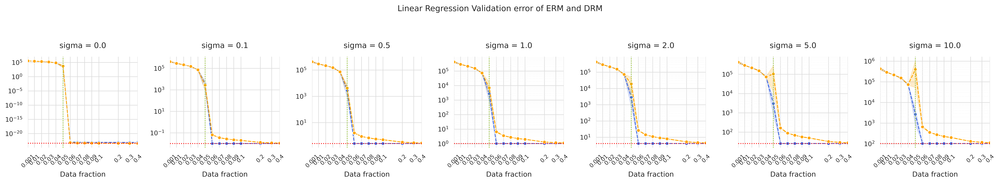

In [183]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=False, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen', label="0")
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(teacher_val_accuracy, ls=':', color='red', label="teacher.error")
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.1,0.4])
      #ax.set_ylim([0.0,100.0])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      ax[i].tick_params(axis='x',  rotation=45)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list):
        h, _ = ax.get_legend_handles_labels()
        ax[i].legend(h, ['DRM.val',
                      'ERM.val',
                      'teacher.val'], 
                    title="", ncol=1, loc="upper right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Linear Regression Validation error of ERM and DRM", y=1.2)


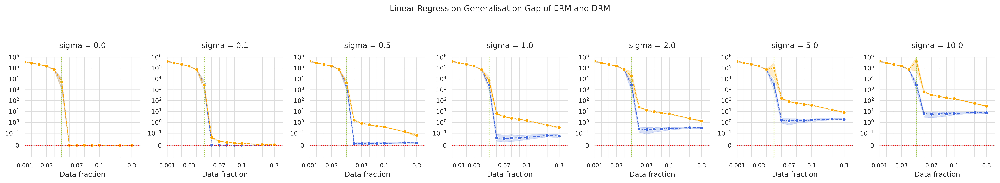

In [174]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=False, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="generalization_gap", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="generalization_gap", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      

      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axvline(0.05, ls=':', color='yellowgreen', label="0")
      ax[i].axhline(0.0, ls=':', color='red', label="0")
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      ax[i].set_yscale('symlog',linthresh=10e-2)
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.1,0.4])
      ax[i].set_ylim([-.1,1000000.0])

      #ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      every_nth = 3
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)
      #ax[i].tick_params(axis='x',  rotation=45)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list):
        h, _ = ax.get_legend_handles_labels()
        ax[i].legend(h, ['DRM.val',
                      'ERM.val',
                      'teacher.val'], 
                    title="", ncol=1, loc="upper right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Linear Regression Generalisation Gap of ERM and DRM", y=1.2)


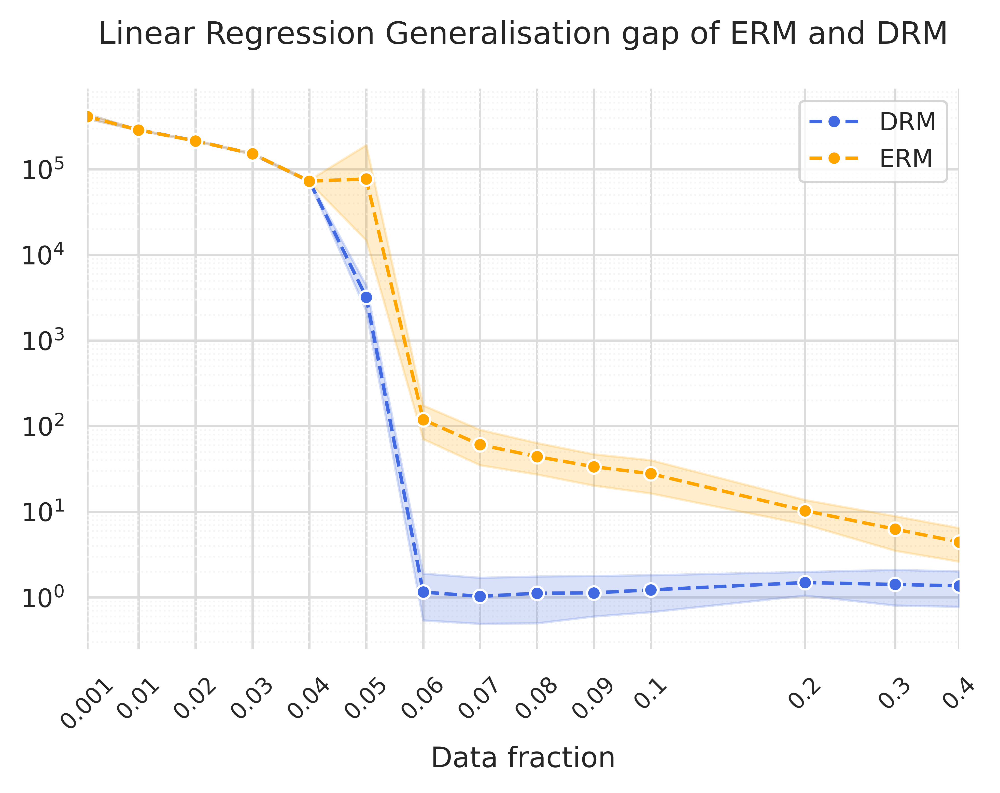

In [184]:
min_max = lambda x: (x.min(), x.max())
noise = .0
working_df = res_df#.loc[res_df['noise']==noise]
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']


    _df = working_df.loc[working_df['alpha']==0.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="generalization_gap", errorbar="ci",
                 markers=True, marker='o', color=colors[0], ls='--',ax=ax, label="distil.val")
    # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
    #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
    _df = working_df.loc[working_df['alpha']==1.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="generalization_gap", errorbar="ci",
                markers=True, marker='o', color=colors[1], ls='--', ax=ax, label="labels.val")
    # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
    #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
    

    #ax.axvline(100.0, ls='--', color='tab:green')
    # ax.axhline(76.034, ls='--', color=colors[2], label="a")
    ax.axhline(0.0, ls=':', color='red', label="0")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_yscale('log')
    ax.set_xscale('symlog',linthresh=10e-2)
    ax.set_xlim([0.1,0.4])
    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(working_df['buffer_size_p'].unique())
    ax.set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
    ax.tick_params(axis='x',  rotation=45)

    # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
    # plt.yticks(yticks)
    # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    #ax.set_ylim(-100,1000000.0)


    ax.set_title(f"Linear Regression Generalisation gap of ERM and DRM", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'Data fraction', fontsize=10, y=+5)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend(h, ['DRM',
                  'ERM'], 
                title="", ncol=1, loc="upper right")


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.8)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('red')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()


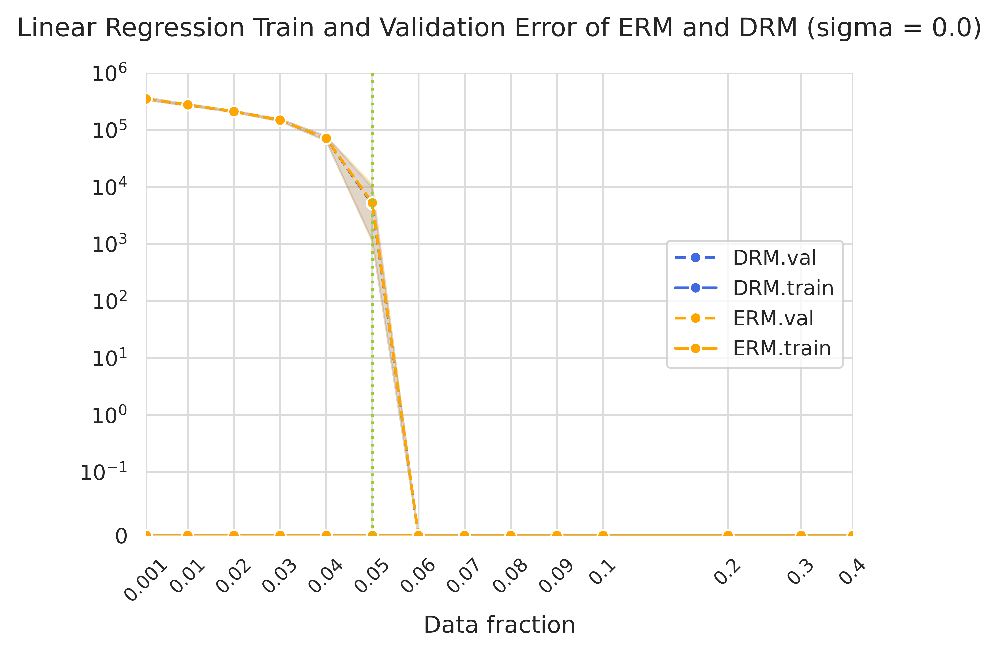

In [185]:
min_max = lambda x: (x.min(), x.max())
noise = 0.0
working_df = res_df.loc[res_df['noise']==noise]
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']


    _df = working_df.loc[working_df['alpha']==0.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                 markers=True, marker='o', color=colors[0], ls='--',ax=ax, label="distil.val")
    sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
                 markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
    _df = working_df.loc[working_df['alpha']==1.0]
    sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                markers=True, marker='o', color=colors[1], ls='--', ax=ax, label="labels.val")
    sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
                markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
    

    #ax.axvline(100.0, ls='--', color='tab:green')
    # ax.axhline(76.034, ls='--', color=colors[2], label="a")
    ax.axvline(0.05, ls=':', color='yellowgreen', label="0")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_yscale('symlog',linthresh=10e-2)
    ax.set_xscale('symlog',linthresh=10e-2)
    ax.set_xlim([0.1,0.4])
    ax.set_ylim([0.0,1000000.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(working_df['buffer_size_p'].unique())
    ax.set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
    ax.tick_params(axis='x',  rotation=45)

    # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
    # plt.yticks(yticks)
    # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    #ax.set_ylim(-100,1000000.0)


    ax.set_title(f"Linear Regression Train and Validation Error of ERM and DRM (sigma = {noise})", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'Data fraction', fontsize=10, y=+5)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend(h, ['DRM.val',
                  'DRM.train',
                  'ERM.val',
                  'ERM.train'], 
                title="", ncol=1, loc="center right")

    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.8)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('red')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()


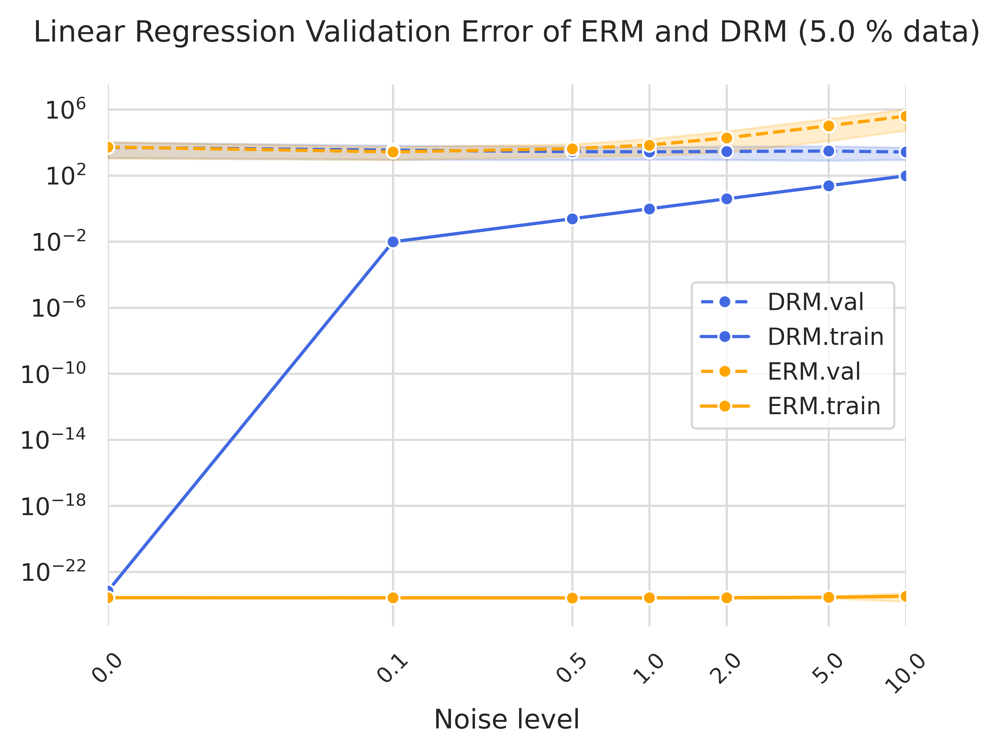

In [186]:
min_max = lambda x: (x.min(), x.max())
data_p = 0.05
working_df = res_df.loc[res_df['buffer_size_p']==data_p]
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(figsize=(5,4), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']


    _df = working_df.loc[working_df['alpha']==0.0]
    sns.lineplot(data=_df, x="noise", y="final_val_acc_S", errorbar="ci",
                 markers=True, marker='o', color=colors[0], ls='--',ax=ax, label="distil.val")
    sns.lineplot(data=_df, x="noise", y="final_train_acc_S", errorbar="sd",
                 markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
    _df = working_df.loc[working_df['alpha']==1.0]
    sns.lineplot(data=_df, x="noise", y="final_val_acc_S", errorbar="ci",
                markers=True, marker='o', color=colors[1], ls='--', ax=ax, label="labels.val")
    sns.lineplot(data=_df, x="noise", y="final_train_acc_S", errorbar="sd",
                markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
    
    # sns.lineplot(data=_df, x="noise", y="final_val_acc_D", errorbar="ci",
    #             markers=True, marker='o', color='red', ls='--', ax=ax, label="teacher.val")

    #ax.axvline(100.0, ls='--', color='tab:green')
    # ax.axhline(76.034, ls='--', color=colors[2], label="a")
    #ax.axhline(teacher_val_accuracy, ls=':', color='red', label="teacher.val")
    # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
    #            fontsize=10, verticalalignment='top', bbox=props)
    ax.set_yscale('log')
    ax.set_xscale('symlog',linthresh=10e-2)
    ax.set_xlim([0.1,0.4])
    #ax.set_ylim([0.0,100.0])

    ax.tick_params(axis='both',  labelsize=9)
    ax.set_xticks(working_df['noise'].unique())
    ax.set_xticklabels([ f'{l}' for l in working_df['noise'].unique()], fontsize=8)
    ax.tick_params(axis='x',  rotation=45)

    # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
    # plt.yticks(yticks)
    # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



    # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
    #ax.set_ylim(-100,1000000.0)


    ax.set_title(f"Linear Regression Validation Error of ERM and DRM ({data_p*100} % data)", fontsize=11, y=1.05)
    ax.set_ylabel(r'', fontsize=11, x=-0.2)
    ax.set_xlabel(r'Noise level', fontsize=10, y=+5)


    #ax[t].legend(title="Eigen-index", loc="upper left")
    # Shrink current axis's height by 10% on the bottom
    
    h, _ = ax.get_legend_handles_labels()
    ax.legend(h, ['DRM.val',
                  'DRM.train',
                  'ERM.val',
                  'ERM.train',
                  'teacher'], 
                title="", ncol=1, loc="center right")


    # AESTHETICS control 
    ax.set_facecolor('white')
    [ax.spines[side].set_visible(False) for side in ax.spines]
    # major and minor grids
    ax.grid(which='major', color='gainsboro', linewidth=0.8)
    ax.grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
    # Make the minor ticks and gridlines show.
    ax.minorticks_on()
    #ax.tick_params(which='minor', bottom=False, left=False)
    #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

    # a = ax.get_ygridlines()
    # b = a[3]
    # b.set_color('red')
    # b.set_linewidth(0.8)
    # b.set_linestyle(':')
    #sns.despine()
    plt.tight_layout()


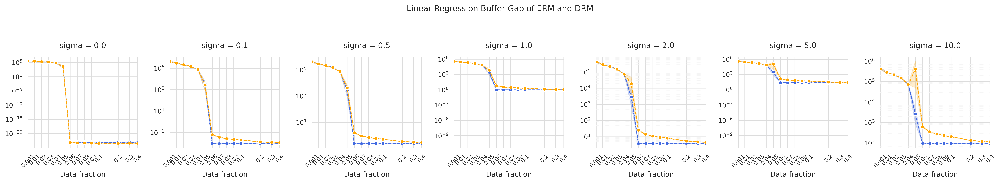

In [187]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=False, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_train_leftout_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_train_leftout_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      

      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(0.0, ls=':', color='red', label="0")
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.1,0.4])
      #ax.set_ylim([0.0,100.0])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      ax[i].tick_params(axis='x',  rotation=45)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list):
        h, _ = ax.get_legend_handles_labels()
        ax[i].legend(h, ['DRM.val',
                      'ERM.val',
                      'teacher.val'], 
                    title="", ncol=1, loc="upper right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Linear Regression Buffer Gap of ERM and DRM", y=1.2)


In [54]:
for i in range(10, 1000, 64):
    print(i)

10
74
138
202
266
330
394
458
522
586
650
714
778
842
906
970


# Classification with logistic regression

In [3]:
logs_path = './logs/results/classification/linear/logs.txt'
results = []
with open(logs_path) as f:
    while line := f.readline():
        results.append(json.loads(line))

In [4]:
res_df = pd.DataFrame(results)
res_df

,problem_type,N,buffer_size,D,G,C,effective_rank,noise,label_noise,data_seed,...,conf_timestamp,conf_host,final_val_acc_D,final_distance_teacher_optimum,buffer_train_time,final_train_acc_S,final_train_leftout_acc_S,final_val_acc_S,final_distance_teacher_student,final_distance_student_optimum
0,classification,10000,200,500,100,2,None,0.5,0.0,13,...,2023-10-02 19:14:47.772026,porcino.inf.ethz.ch,1.000,2.324598,0.018033,1.00000,1.000000,1.000,0.776279,1.694645
1,classification,10000,200,500,100,2,None,0.0,0.0,13,...,2023-10-02 19:14:47.828163,porcino.inf.ethz.ch,1.000,2.049179,0.033430,1.00000,1.000000,1.000,0.180858,1.922246
2,classification,10000,200,500,100,2,None,2.0,0.0,13,...,2023-10-02 19:14:48.063083,porcino.inf.ethz.ch,0.966,25.387275,0.035669,1.00000,0.922551,0.930,24.541974,1.642375
3,classification,10000,200,500,100,2,None,0.1,0.0,13,...,2023-10-02 19:14:48.184525,porcino.inf.ethz.ch,1.000,2.056646,0.060018,1.00000,1.000000,1.000,0.209451,1.919253
4,classification,10000,200,500,100,2,None,5.0,0.0,13,...,2023-10-02 19:14:48.155459,porcino.inf.ethz.ch,0.812,0.201449,0.032995,0.84000,0.701531,0.697,0.878322,0.974604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2205,classification,10000,4000,500,100,2,None,8.0,0.0,13,...,2023-10-03 10:36:24.533672,porcino.inf.ethz.ch,0.706,0.080841,0.065705,0.76575,0.668667,0.681,0.053391,0.105811
2206,classification,10000,4000,500,100,2,None,20.0,0.0,13,...,2023-10-03 10:36:24.555633,porcino.inf.ethz.ch,0.571,0.017132,0.147516,0.68150,0.549000,0.554,0.017806,0.026080
2207,classification,10000,4000,500,100,2,None,20.0,0.0,13,...,2023-10-03 10:36:24.608585,porcino.inf.ethz.ch,0.571,0.017132,0.108280,0.66800,0.546167,0.540,0.017695,0.025231
2208,classification,10000,4000,500,100,2,None,15.0,0.0,13,...,2023-10-03 10:36:24.519794,porcino.inf.ethz.ch,0.605,0.026812,0.067226,0.69875,0.577667,0.587,0.024334,0.038492


In [5]:
res_df.columns

Index(['problem_type', 'N', 'buffer_size', 'D', 'G', 'C', 'effective_rank',
       'noise', 'label_noise', 'data_seed', 'alpha', 'distillation_type',
       'gpus_id', 'seed', 'notes', 'non_verbose', 'disable_log', 'validation',
       'ignore_other_metrics', 'debug_mode', 'nowand', 'wandb_entity',
       'wandb_project', 'wandb_name', 'conf_jobnum', 'conf_timestamp',
       'conf_host', 'final_val_acc_D', 'final_distance_teacher_optimum',
       'buffer_train_time', 'final_train_acc_S', 'final_train_leftout_acc_S',
       'final_val_acc_S', 'final_distance_teacher_student',
       'final_distance_student_optimum'],
      dtype='object')

In [6]:
SEEDS = [11, 13, 21, 33, 55 ,5,138,228,196,118]
BUFFER_SIZES = [10, 100, 500, 1000, 2000, 3000, 4000]
NOISE = [0.0, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 20.0]

In [7]:
res_df['buffer_size_p'] = res_df['buffer_size']/(10000)
res_df['generalization_gap'] = res_df['final_val_acc_S']-res_df['final_train_acc_S']
res_df['buffer_gap'] = res_df['final_train_leftout_acc_S']-res_df['final_train_acc_S']
res_df['final_val_acc_S_p'] = 100*res_df['final_val_acc_S']/(res_df['final_val_acc_D'])
res_df['final_train_acc_S_p'] = 100*res_df['final_train_acc_S']/(res_df['final_val_acc_D'])

In [8]:
res_df['buffer_size_p'].unique(), res_df['noise'].unique()


(array([0.02, 0.03, 0.04, 0.06, 0.07, 0.08, 0.09, 0.2 , 0.3 , 0.4 ]),
 array([ 0.5,  0. ,  2. ,  0.1,  5. , 10. ,  1. , 15. , 20. ,  6. ,  8. ]))

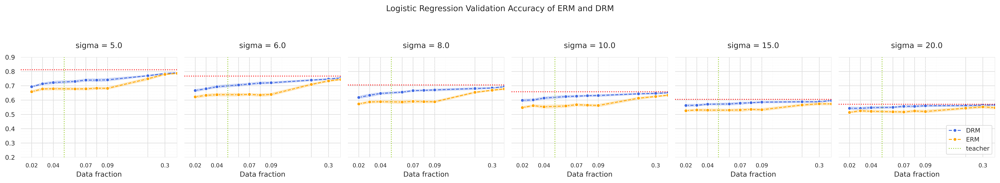

In [9]:
noise_list = sorted(list(res_df['noise'].unique()))
noise_list = noise_list[5:]

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen', label="0")
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(teacher_val_accuracy, ls=':', color='red', label="teacher.error")
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      ax[i].set_ylim([0.2,0.9])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="lower right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Logistic Regression Validation Accuracy of ERM and DRM", y=1.2)


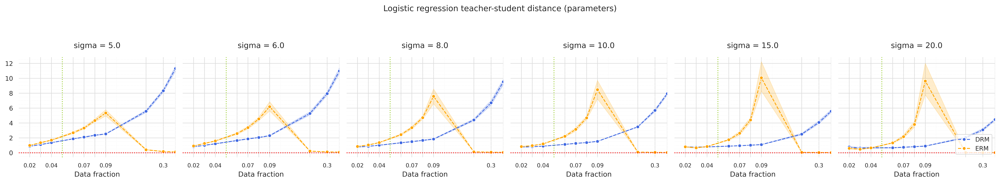

In [12]:
noise_list = sorted(list(res_df['noise'].unique()))
noise_list = noise_list[5:]

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_distance_teacher_student", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_distance_teacher_student", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen')
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(0, ls=':', color='red')
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      #ax[i].set_ylim([0.2,0.9])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="lower right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Logistic regression teacher-student distance (parameters)", y=1.2)


# Classification linear network

In [40]:
logs_path = './logs/results/classification/linearnet/logs.txt'
results = []
with open(logs_path) as f:
    while line := f.readline():
        results.append(json.loads(line))

In [41]:
res_df = pd.DataFrame(results)
res_df

,N,buffer_size,D,G,C,effective_rank,noise,label_noise,data_seed,alpha,...,conf_timestamp,conf_host,final_val_acc_D,buffer_train_time,final_train_acc_S,final_train_leftout_acc_S,final_val_acc_S,final_train_function_distance,final_val_function_distance,final_distance_teacher_student
0,10000,100,500,500,10,None,0.1,0.0,13,0.0,...,2023-10-05 14:31:24.242256,donald.inf.ethz.ch,100.0,0.523209,100.000,100.000000,100.0,0.000000,0.000000,474.066193
1,10000,100,500,500,10,None,0.0,0.0,13,0.0,...,2023-10-05 14:31:24.275836,donald.inf.ethz.ch,100.0,0.555648,100.000,100.000000,100.0,0.000000,0.000000,438.516998
2,10000,100,500,500,10,None,0.5,0.0,13,0.0,...,2023-10-05 14:31:24.233867,donald.inf.ethz.ch,100.0,0.541217,100.000,98.969697,99.0,0.000000,0.014032,805.261536
3,10000,100,500,500,10,None,1.0,0.0,13,0.0,...,2023-10-05 14:31:24.218726,donald.inf.ethz.ch,100.0,0.523553,100.000,95.777778,94.2,0.000000,0.081451,1191.569092
4,10000,100,500,500,10,None,2.0,0.0,13,0.0,...,2023-10-05 14:31:24.306740,donald.inf.ethz.ch,84.3,0.500292,99.000,56.909091,55.5,0.013934,0.626856,5738.322754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2635,10000,4000,500,500,10,None,5.0,0.0,13,1.0,...,2023-10-09 12:02:02.561820,obsession.inf.ethz.ch,31.0,3.167675,49.050,27.950000,28.9,0.815481,0.868416,2998.156982
2636,10000,4000,500,500,10,None,4.0,0.0,13,1.0,...,2023-10-09 12:02:02.512835,obsession.inf.ethz.ch,40.0,2.988729,71.075,36.266667,36.2,0.670506,0.769314,3262.780762
2637,10000,4000,500,500,10,None,5.0,0.0,13,1.0,...,2023-10-09 12:02:02.576086,obsession.inf.ethz.ch,29.8,3.045595,48.950,27.366667,27.9,0.821496,0.864098,3034.968262
2638,10000,4000,500,500,10,None,4.0,0.0,13,1.0,...,2023-10-09 12:02:02.543472,obsession.inf.ethz.ch,40.5,3.301936,71.725,36.833333,37.6,0.640735,0.748860,3284.217529


In [42]:
res_df.columns

Index(['N', 'buffer_size', 'D', 'G', 'C', 'effective_rank', 'noise',
       'label_noise', 'data_seed', 'alpha', 'distillation_type', 'lr',
       'checkpoints', 'pretrained', 'optim_wd', 'optim_adam', 'optim_mom',
       'optim_warmup', 'optim_nesterov', 'optim_cosineanneal', 'n_epochs',
       'n_epochs_stud', 'batch_size', 'MSE', 'gpus_id', 'seed', 'notes',
       'non_verbose', 'disable_log', 'validation', 'ignore_other_metrics',
       'debug_mode', 'nowand', 'wandb_entity', 'wandb_project', 'wandb_name',
       'conf_jobnum', 'conf_timestamp', 'conf_host', 'final_val_acc_D',
       'buffer_train_time', 'final_train_acc_S', 'final_train_leftout_acc_S',
       'final_val_acc_S', 'final_train_function_distance',
       'final_val_function_distance', 'final_distance_teacher_student'],
      dtype='object')

In [43]:
SEEDS = [11, 13, 21, 33, 55 ,5,138,228,196,118]
BUFFER_SIZES = [10, 100, 500, 1000, 2000, 3000, 4000]
NOISE = [0.0, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0, 20.0]

In [44]:
res_df['buffer_size_p'] = res_df['buffer_size']/(10000)
res_df['generalization_gap'] = res_df['final_val_acc_S']-res_df['final_train_acc_S']
res_df['buffer_gap'] = res_df['final_train_leftout_acc_S']-res_df['final_train_acc_S']
res_df['final_val_acc_S_p'] = 100*res_df['final_val_acc_S']/(res_df['final_val_acc_D'])
res_df['final_train_acc_S_p'] = 100*res_df['final_train_acc_S']/(res_df['final_val_acc_D'])

In [45]:
res_df['buffer_size_p'].unique(), res_df['noise'].unique()


(array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.2 ,
        0.3 , 0.4 ]),
 array([0.1, 0. , 0.5, 1. , 2. , 5. , 4. , 3. ]))

In [100]:
res_df2 = res_df
res_df2 = res_df2.drop(axis=0, index=list(res_df.loc[res_df['noise']>=4.0].loc[res_df['conf_timestamp'].str.contains('2023-10-09')].index))

In [101]:
res_df2

,N,buffer_size,D,G,C,effective_rank,noise,label_noise,data_seed,alpha,...,final_train_leftout_acc_S,final_val_acc_S,final_train_function_distance,final_val_function_distance,final_distance_teacher_student,buffer_size_p,generalization_gap,buffer_gap,final_val_acc_S_p,final_train_acc_S_p
0,10000,100,500,500,10,None,0.1,0.0,13,0.0,...,100.000000,100.0,0.000000,0.000000,474.066193,0.01,0.000,0.000000,100.000000,100.000000
1,10000,100,500,500,10,None,0.0,0.0,13,0.0,...,100.000000,100.0,0.000000,0.000000,438.516998,0.01,0.000,0.000000,100.000000,100.000000
2,10000,100,500,500,10,None,0.5,0.0,13,0.0,...,98.969697,99.0,0.000000,0.014032,805.261536,0.01,-1.000,-1.030303,99.000000,100.000000
3,10000,100,500,500,10,None,1.0,0.0,13,0.0,...,95.777778,94.2,0.000000,0.081451,1191.569092,0.01,-5.800,-4.222222,94.200000,100.000000
4,10000,100,500,500,10,None,2.0,0.0,13,0.0,...,56.909091,55.5,0.013934,0.626856,5738.322754,0.01,-43.500,-42.090909,65.836299,117.437722
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2075,10000,4000,500,500,10,None,3.0,0.0,13,1.0,...,53.750000,53.9,0.398117,0.556157,4976.470703,0.40,-45.375,-45.525000,89.386401,164.635158
2076,10000,4000,500,500,10,None,5.0,0.0,13,1.0,...,27.950000,28.9,0.816589,0.852363,3023.047363,0.40,-20.150,-21.100000,105.090909,178.363636
2077,10000,4000,500,500,10,None,1.0,0.0,13,1.0,...,100.000000,100.0,0.009480,0.015430,1699.983276,0.40,0.000,0.000000,100.000000,100.000000
2078,10000,4000,500,500,10,None,4.0,0.0,13,1.0,...,36.833333,37.6,0.663893,0.747559,3223.152588,0.40,-34.125,-34.891667,89.952153,171.590909


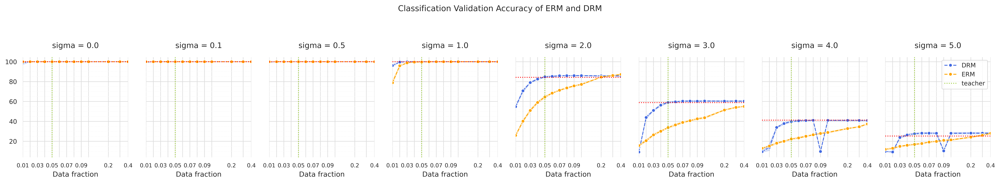

In [103]:
noise_list = sorted(list(res_df2['noise'].unique()))
#noise_list = noise_list[5:]

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df2.loc[res_df2['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_acc_S", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen', label="0")
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(teacher_val_accuracy, ls=':', color='red', label="teacher.error")
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      #ax[i].set_ylim([0.2,0.9])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="upper right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Classification Validation Accuracy of ERM and DRM", y=1.2)


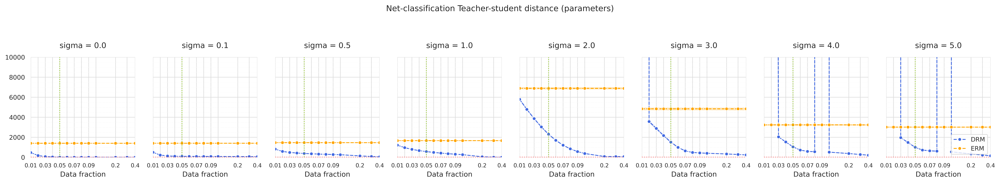

In [104]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=True, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_distance_teacher_student", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_distance_teacher_student", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen')
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(0, ls=':', color='red')
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      ax[i].set_ylim([0.0,10e3])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="lower right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Net-classification Teacher-student distance (parameters)", y=1.2)


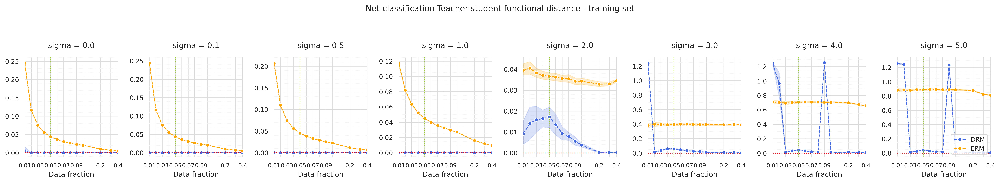

In [105]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=False, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_train_function_distance", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_train_function_distance", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen')
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(0, ls=':', color='red')
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      #ax[i].set_ylim([0.0,1.1])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="lower right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Net-classification Teacher-student functional distance - training set", y=1.2)


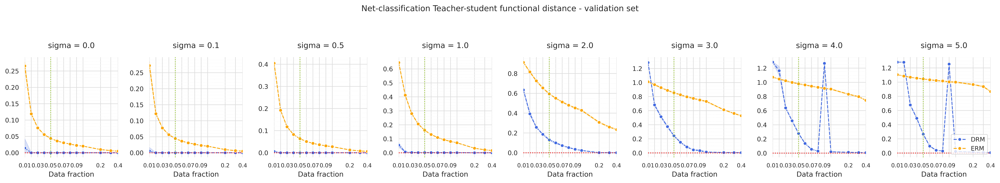

In [106]:
noise_list = sorted(list(res_df['noise'].unique()))

min_max = lambda x: (x.min(), x.max())
%matplotlib inline
sns.set_context("paper")
with sns.axes_style("whitegrid"):
    fig, ax = plt.subplots(1,len(noise_list), figsize=(20,3), sharey=False, dpi=800)
    colors = ['royalblue','orange','dimgray']

    for i, noise in enumerate(noise_list):
      working_df = res_df.loc[res_df['noise']==noise]
      teacher_val_accuracy = list(working_df['final_val_acc_D'])[0]
      _df = working_df.loc[working_df['alpha']==0.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_function_distance", errorbar="ci",
                  markers=True, marker='o', color=colors[0], ls='--',ax=ax[i], label="distil.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #              markers=True, marker='o', color=colors[0], ls='-', ax=ax, label="distil.train")
      _df = working_df.loc[working_df['alpha']==1.0]
      sns.lineplot(data=_df, x="buffer_size_p", y="final_val_function_distance", errorbar="ci",
                  markers=True, marker='o', color=colors[1], ls='--', ax=ax[i], label="labels.val")
      # sns.lineplot(data=_df, x="buffer_size_p", y="final_train_acc_S", errorbar="sd",
      #             markers=True, marker='o', color=colors[1], ls='-', ax=ax, label="labels.train")
      
      ax[i].axvline(0.05, ls=':', color='yellowgreen')
      #ax.axvline(100.0, ls='--', color='tab:green')
      # ax.axhline(76.034, ls='--', color=colors[2], label="a")
      ax[i].axhline(0, ls=':', color='red')
      # # props = dict(boxstyle='square', facecolor='white', alpha=0.5)
      # ax.text(0.01, 0.9, 'teacher.val', transform=ax.transAxes, 
      #            fontsize=10, verticalalignment='top', bbox=props)
      #ax[i].set_yscale('log')
      ax[i].set_xscale('symlog',linthresh=10e-2)
      ax[i].set_xlim([0.01,0.4])
      #ax[i].set_ylim([0.0,1.1])

      ax[i].tick_params(axis='both',  labelsize=9)
      ax[i].set_xticks(working_df['buffer_size_p'].unique())
      ax[i].set_xticklabels([ f'{l}' for l in working_df['buffer_size_p'].unique()], fontsize=8)
      #ax[i].tick_params(axis='x',  rotation=45)
      every_nth = 2
      for n, label in enumerate(ax[i].xaxis.get_ticklabels()):
          if n % every_nth != 0:
              label.set_visible(False)

      # yticks = [0.0, 25.0, 50.0, teacher_val_accuracy, 100.0]
      # plt.yticks(yticks)
      # ax.set_yticklabels([0.0, 25.0, 50.0, 'teacher.val', 100.0], fontsize=8)



      # #ax.text(10.0,0, "Local", color="white", bbox={'facecolor': 'tab:green', 'alpha': 0.5, 'pad': 10})
      #ax.set_ylim(-100,1000000.0)


      ax[i].set_title(f"sigma = {noise}", fontsize=11, y=1.05)
      ax[i].set_ylabel(r'', fontsize=11, x=-0.2)
      ax[i].set_xlabel(r'Data fraction', fontsize=10, y=+5)


      #ax[t].legend(title="Eigen-index", loc="upper left")
      # Shrink current axis's height by 10% on the bottom
      if i==len(noise_list)-1:
        h, _ = ax[i].get_legend_handles_labels()
        ax[i].legend(h, ['DRM','ERM','teacher'], 
                    title="", ncol=1, loc="lower right")
      else: ax[i].get_legend().remove()


      # AESTHETICS control 
      ax[i].set_facecolor('white')
      [ax[i].spines[side].set_visible(False) for side in ax[i].spines]
      # major and minor grids
      ax[i].grid(which='major', color='gainsboro', linewidth=0.8)
      ax[i].grid(which='minor', color='whitesmoke', linestyle=':', linewidth=0.6)
      # Make the minor ticks and gridlines show.
      ax[i].minorticks_on()
      #ax.tick_params(which='minor', bottom=False, left=False)
      #fig.supxlabel(r' % of dataset used', fontsize=12, y=-0.1)

      # a = ax.get_ygridlines()
      # b = a[3]
      # b.set_color('red')
      # b.set_linewidth(0.8)
      # b.set_linestyle(':')
      #sns.despine()
      plt.tight_layout()
    plt.suptitle("Net-classification Teacher-student functional distance - validation set", y=1.2)
